# Blockchain TX node classification with GCN

In [17]:
# pip list

In [1]:
from torch_geometric.utils import to_networkx
import networkx as nx
import pandas as pd
# from io import StringIO
import matplotlib.pyplot as plt
from pandas import json_normalize
import json

# 取引履歴csvファイルをDataFrameに読み込み
df = pd.read_csv("output6.csv")
# valueが空欄のtransactionを削除
df = df.dropna(subset=['value'])
# JSONの列をキーごとに別々の列にして別のDataFrameに
df_json = json_normalize(df['value'].apply(lambda x: json.loads(x)))
# 送金元と送金先のペアを抽出
df = df[['from','to']]
# 送金元と送金先のペアに送金額を横結合
df = pd.concat([df[['from','to']], df_json['hex']], axis=1)
# 送金額ゼロのtransactionを削除
df = df[df['hex'] != '0x00']
# 送金額を16進数(str)から10進数(int)に
df['hex'] = df['hex'].apply(int, base=16)
# 列名変更
df = df.rename({'hex': 'weight'}, axis='columns')
df['weight'] = df['weight']/2000000000000000000
# DataFrame表示
df

,from,to,weight
1,0x044a6D1c28F483996D661de39e1E06b4C58ADF03,0x21671a68B84fc1d9b17Be7123990C49c223EA70e,0.04
2,0x1fc35B79FB11Ea7D4532dA128DfA9Db573C51b09,0xDe7De2dC485D2d7A7F3d179721EC6be3b7330271,0.25
3,0x1fc35B79FB11Ea7D4532dA128DfA9Db573C51b09,0x1fD50a9Be019139E06e0A7Ca9908c39eB80a4C76,0.25
4,0x1fc35B79FB11Ea7D4532dA128DfA9Db573C51b09,0xA285Ef38a0D898d808383284CD9f264d64953e51,0.25
5,0x1fc35B79FB11Ea7D4532dA128DfA9Db573C51b09,0xB340B8E7d2c38d2C96fe24631bC854B0E24517e3,0.25
...,...,...,...
4544,0x2d7DB1f237B1B55afadaf39dD54D30a0320b1D2c,0xB9A60416f2dea96C07A9Ab53e35350888D2D67e0,0.004592
4545,0x90Aad0315430F919F7bA4f466CC0EA31CB6B8294,0x0ead86A1dE353469c8155Eb83d5dB615cc5d1d77,0.000362
4546,0xa4fbD2f2Fd7C57F52538ed4580b7e7ABa26013Fa,0x0ead86A1dE353469c8155Eb83d5dB615cc5d1d77,0.000362
4547,0xb1e9a2c2C3aCfD9aBc50861569bE6D18cAeCFFA3,0x0ead86A1dE353469c8155Eb83d5dB615cc5d1d77,0.000386


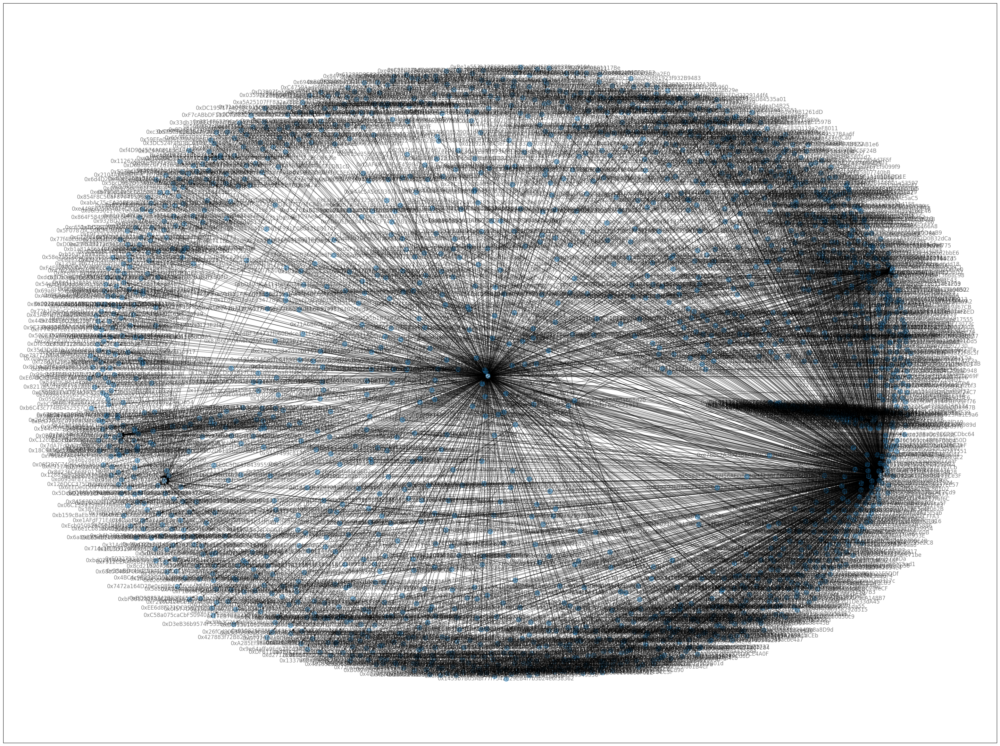

In [2]:
# https://qiita.com/niship2/items/9d7e2b6ab2ca1be18eaf
import matplotlib.pyplot as plt

# 可視化画面のサイズを設定
plt.figure(figsize=(40, 30))
# 可視化ライブラリの仕様に列名を変更
df.columns = ['source','target','weight']
# 可視化ライブラリの仕様にデータ型を変更
df.loc[:,'source'] = df.loc[:, 'source'].astype(str)
df.loc[:,'target'] = df.loc[:, 'target'].astype(str)
df.loc[:,'weight'] = df.loc[:, 'weight'].astype(str)
# 可視化ライブラリにエッジのリストとしてDataFrameを渡す
# G = nx.from_pandas_edgelist(df,create_using=nx.DiGraph())
G = nx.from_pandas_edgelist(df, 'source','target', 'weight',create_using=nx.DiGraph())
# 可視化の設定を渡して描画
nx.draw_networkx(G,
        alpha=0.5,
        with_labels = True,
        node_size=120) #修正済み
# 画像表示
plt.show()

In [3]:
from pyvis.network import Network
pyvis_G = Network(directed=True)
pyvis_G.from_nx(G)
pyvis_G.toggle_physics(True)  #修正済み，enable→toggle　html上でレイアウト動かしたくない場合false
# pyvis_G.toggle_physics('false')
pyvis_G.show_buttons()
pyvis_G.show("mygraph.html", notebook=False)

mygraph.html


## 取引履歴データ読み込みと前処理

In [8]:
import torch
from torch_geometric.data import Data
from torch_geometric.utils import to_networkx
import networkx as nx
import pandas as pd
# from io import StringIO
import matplotlib.pyplot as plt
import numpy as np

df = pd.read_csv("output6.csv")
df = df[['from','to']]
df.head(10)

df = df.dropna(how='any')
df_from = df['from']
df_to = df['to']

df_all = pd.DataFrame()
df_all['from_to'] = pd.concat(
    [df_from, df_to],
    axis=0,
    ignore_index=True
)
df_all['source_target'] = df_all.groupby(['from_to']).ngroup()
df_all.to_csv('df_all.csv')
df_all_unq = df_all.drop_duplicates().sort_values('source_target')
df_all_unq['random_lbl'] = pd.Series( np.random.random( len(df_all_unq) ), index=df_all_unq.index )
df_all_unq['label'] = 1
df_all_unq['label'] = df_all_unq['label'].where(df_all_unq['random_lbl'] < 0.4, 0)
df_all_unq['random'] = pd.Series( np.random.random( len(df_all_unq) ), index=df_all_unq.index )
df_all_unq['train_mask'] = False
df_all_unq['train_mask'] = df_all_unq['train_mask'].where(df_all_unq['random'] < 0.2, True)
df_all_unq['test_mask'] = True
df_all_unq['test_mask'] = df_all_unq['test_mask'].where(df_all_unq['random'] < 0.2, False)
df_all_unq['val_mask'] = False
df_all_unq.to_csv('df_all_unq.csv')

edges1 = df_all[:df_from.shape[0]]
edges2 = df_all[df_from.shape[0]:]
edges2 = edges2.reset_index(drop=True)
edges = pd.concat([edges1['source_target'], edges2['source_target']], axis=1)
edges.to_csv('edges_org.csv')
edges.columns = ['source','target']
edges.loc[:,'source'] = edges.loc[:, 'source'].astype(str)
edges.loc[:,'target'] = edges.loc[:, 'target'].astype(str)
edges.to_csv('edges.csv')

# 可視化ライブラリPyvisにエッジのリストとしてDataFrameを渡す
G = nx.from_pandas_edgelist(edges, 'source','target',create_using=nx.DiGraph())

edge_index = torch.tensor([edges1['source_target'].tolist(), edges2['source_target'].tolist()], dtype=torch.long)

# 各ノードの特徴量（乱数）
x = torch.tensor([df_all_unq['random_lbl'].tolist()], dtype=torch.float)
x = torch.t(x)
# 各ノードのラベル（0 or 1)
y = torch.tensor(df_all_unq['label'].tolist(), dtype=torch.long)
# 学習用データ(ノード）を指定
train_mask = torch.tensor(df_all_unq['train_mask'].tolist(), dtype=torch.bool)
# テスト用データ(ノード）を指定
test_mask = torch.tensor(df_all_unq['test_mask'].tolist(), dtype=torch.bool)
# 検証用データ(ノード）を指定（今回は使用せず）
val_mask = torch.tensor(df_all_unq['val_mask'].tolist(), dtype=torch.bool)

data = Data(x=x, y=y, edge_index=edge_index,train_mask=train_mask,test_mask=test_mask,val_mask=val_mask)
print(data)

Data(x=[3481, 1], edge_index=[2, 4532], y=[3481], train_mask=[3481], test_mask=[3481], val_mask=[3481])


## グラフの属性一覧

In [9]:
def graph_info(data):

    print("ノードの数:", data.num_nodes)
    print("エッジの数:", data.num_edges)
    print("特徴量の数:", data.num_node_features)
    print("無向グラフか？:", data.is_undirected())
    print("孤立したノードが有るか？:", data.has_isolated_nodes())
    print("自己ループがあるか？:", data.has_self_loops())

    print()

    print("キー: ", data.keys)
    print("各ノードの特徴量")
    print(data["x"])
    print("各ノードのラベル")
    print(data["y"])
    print("各エッジ")
    print(data["edge_index"])
    print("train_mask")
    print(data["train_mask"])
    print("val_mask")
    print(data["val_mask"])
    print("test_mask")
    print(data["test_mask"])
    
    
graph_info(data)

ノードの数: 3481
エッジの数: 4532
特徴量の数: 1
無向グラフか？: False
孤立したノードが有るか？: True
自己ループがあるか？: True

キー:  <bound method BaseData.keys of Data(x=[3481, 1], edge_index=[2, 4532], y=[3481], train_mask=[3481], test_mask=[3481], val_mask=[3481])>
各ノードの特徴量
tensor([[0.6072],
        [0.3855],
        [0.8750],
        ...,
        [0.4705],
        [0.4331],
        [0.5210]])
各ノードのラベル
tensor([0, 1, 0,  ..., 0, 0, 0])
各エッジ
tensor([[2461,   55,  434,  ..., 2842, 2932,  106],
        [1568,  452, 2581,  ...,  214,  214,  214]])
train_mask
tensor([ True,  True, False,  ...,  True,  True,  True])
val_mask
tensor([False, False, False,  ..., False, False, False])
test_mask
tensor([False, False,  True,  ..., False, False, False])


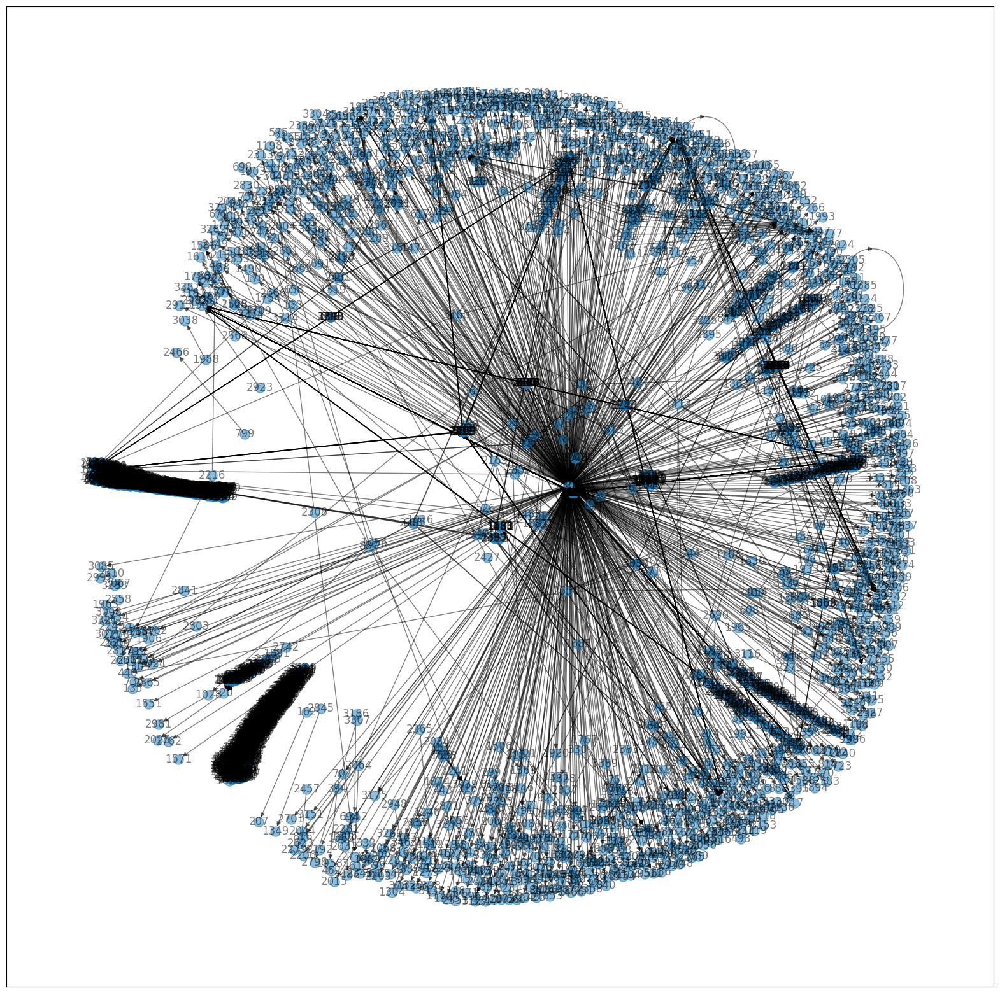

In [10]:
from torch_geometric.utils import to_networkx
import networkx as nx
import matplotlib.pyplot as plt

# 可視化画面のサイズを設定
plt.figure(figsize=(20, 20))
# networkxのグラフに変換
nxg = to_networkx(data)

# nx.draw(nxg)　#これだとエラー
nx.draw_networkx(nxg,
        alpha=0.5,
        with_labels = True,
        node_size=120) #修正済み

In [11]:
from pyvis.network import Network
pyvis_G = Network(directed=True)
pyvis_G.from_nx(G)
pyvis_G.toggle_physics(True)  #修正済み，enable→toggle　html上でレイアウト動かしたくない場合false
# pyvis_G.toggle_physics('false')
pyvis_G.show_buttons()
pyvis_G.show("mygraph.html", notebook=False)

mygraph.html


## GCN simple

In [12]:
import torch
import torch.nn as nn
from torch_geometric.nn import GCNConv

class GCN(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = GCNConv(data.num_node_features, 32)
        self.relu = nn.ReLU()  # ReLU
        self.conv2 = GCNConv(32, 2)

    def forward(self, data):
        x = data.x
        edge_index = data.edge_index

        x = self.conv1(x, edge_index)
        x = self.relu(x)
        x = self.conv2(x, edge_index)

        return x

net = GCN()

## 学習

In [13]:
from torch import optim

# data = data.cuda()  # GPU対応

# 交差エントロピー誤差関数
loss_fnc = nn.CrossEntropyLoss()

# 最適化アルゴリズム
optimizer = optim.Adam(net.parameters())

net.train()  # 訓練モード
for epoch in range(200):
    optimizer.zero_grad()  # ①勾配の初期化
    out = net(data)  # ②順伝播により予測値を得る
    loss = loss_fnc(out[data.train_mask], data.y[data.train_mask])  # ③予測値と正解値から誤差を計算

    loss.backward()  # ④誤差からバックプロパゲーションにより勾配を計算
    optimizer.step()  # ⑤最適化アルゴリズムによりパラメータを更新

## テスト用ノードでモデルを評価

In [14]:
net.eval()  # 評価モード
pred = net(data).argmax(dim=1)
correct = (pred[data.test_mask] == data.y[data.test_mask]).sum()
accuracy = int(correct) / int(data.test_mask.sum())
print("正解率:", str(accuracy*100) + "%")

正解率: 77.85817655571635%


## モデル評価結果の出力

In [15]:
df_all_unq_slctd = df_all_unq[['from_to','source_target', 'label', 'test_mask']]
df_all_unq_slctd = df_all_unq_slctd.reset_index(drop=True)

df_pred = pd.DataFrame(pred.numpy())
df_pred.columns = ['pred']
df_test_result = pd.concat([df_all_unq_slctd, df_pred], axis=1)
df_test_result = df_test_result[df_test_result['test_mask'] != False]
# df_test_result.eval('flg=label==pred')
df_test_result.loc[df_test_result['label'] == df_test_result['pred'], 'correct'] = 1
df_test_result.loc[df_test_result['label'] != df_test_result['pred'], 'correct'] = 0
df_test_result['correct'] = df_test_result['correct'].astype(bool)
df_test_result.to_csv('test_result.csv')
accuracy_chk = df_test_result['correct'].mean()
print("正解率:", str(accuracy_chk*100) + "%")
df_test_result

正解率: 77.85817655571635%


,from_to,source_target,label,test_mask,pred,correct
2,0x001C124488545022f32c963CAFA2CEf7fCb2796F,2,0,True,0,True
4,0x0033299F8fb751a059246b4c7FC9447193Be10B5,4,0,True,0,True
7,0x005A6F581d415925aAACd153d68dd3F876ddf04D,7,0,True,0,True
10,0x00DA0b3a9c5F632c1e402BCc5478b90081AA902B,10,0,True,0,True
28,0x02139C8A769086Aa711F789597E98b503d4A22Ed,28,0,True,0,True
...,...,...,...,...,...,...
3453,0xfF00000000000000000000000000000005782825,3453,1,True,0,False
3459,0xfa6F71d205c2E7e3c7FE61B59969b4A32A305Ca5,3459,0,True,0,True
3462,0xfb95c2861a4139f42921985E3eFFCFbf08F2afa7,3462,0,True,0,True
3464,0xfd4e72C4008788251Bc1a93E8A1c5f73d3A32adA,3464,0,True,0,True


In [16]:
df_test_result['correct'].sum()

538

## GCN

In [33]:
from torch_geometric.datasets import TUDataset
from torch_geometric.loader import DataLoader

In [34]:
dataset = TUDataset(root="/tmp/MUTAG", name="MUTAG")

dataset = dataset.shuffle()  # データセットをシャッフル
dataset_train = dataset[:140]  # 訓練用データセット
dataset_test = dataset[140:]  # テスト用データセット

batch_size = 64  # バッチサイズ
loader_train = DataLoader(dataset_train, batch_size=batch_size, shuffle=True)
loader_test = DataLoader(dataset_test, batch_size=batch_size, shuffle=False)

In [35]:
print(dataset)

MUTAG(188)


GCNのモデルを構築します。
層の実装には、GCNConv()を利用しますが、以下のように設定します。

GCNConv(入力の特徴量数, 出力の特徴量数)
https://pytorch-geometric.readthedocs.io/en/latest/modules/nn.html#torch_geometric.nn.conv.GCNConv
今回は、全結合層の前にニューロンをランダムに削除する「ドロップアウト」を導入します。
ドロップアウトを導入することで、未知のデータに対してより頑強になるようにモデルを訓練することができます。
https://pytorch.org/docs/stable/generated/torch.nn.Dropout.html

In [36]:
import torch
import torch.nn as nn
from torch_geometric.nn import GCNConv
from torch_geometric.nn import global_mean_pool

In [37]:
n_h = 64  # 中間層における特徴量の数

class GCN(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = GCNConv(dataset.num_node_features, n_h)
        self.conv2 = GCNConv(n_h, n_h)
        self.conv3 = GCNConv(n_h, n_h)
        self.fc = nn.Linear(n_h, dataset.num_classes)  # 全結合層

        self.relu = nn.ReLU()  # ReLU
        self.dropout = nn.Dropout(p=0.5)  # ドロップアウト:(p=ドロップアウト率)

    def forward(self, data):
        x = data.x
        edge_index = data.edge_index
        batch = data.batch

        x = self.conv1(x, edge_index)
        x = self.relu(x)
        x = self.conv2(x, edge_index)
        x = self.relu(x)
        x = self.conv3(x, edge_index)

        # 全てのノードで各特徴量の平均をとる
        x = global_mean_pool(x, batch)  # (バッチサイズ, 特徴量の数)に変換

        x = self.dropout(x)
        x = self.fc(x)
        
        return x

net = GCN()
# net.cuda()  #GPU対応

global_mean_pool()は、「ノードの次元」で各特徴量の平均をとることにより、データを(バッチサイズ, 特徴量の数)に変換します。

## 学習

In [38]:
def eval(loader):
    correct = 0  # 正解数

    for data in loader:
#         data = data.cuda()  # GPU対応
        out = net(data)  
        pred = out.argmax(dim=1)
        correct += int((pred == data.y).sum())

    return correct/len(loader.dataset)  # 正解率

from torch import optim

# 交差エントロピー誤差関数
loss_fnc = nn.CrossEntropyLoss()

# 最適化アルゴリズム
optimizer = optim.Adam(net.parameters())

for epoch in range(200):
    # 訓練
    net.train()  # 訓練モード
    for data in loader_train: 
#         data = data.cuda()  # GPU対応

        optimizer.zero_grad()  # ①勾配の初期化
        out = net(data)  # ②順伝播により予測値を得る
        loss = loss_fnc(out, data.y)  # ③予測値と正解値から誤差を計算

        loss.backward()  # ④誤差からバックプロパゲーションにより勾配を計算
        optimizer.step()  # ⑤最適化アルゴリズムによりパラメータを更新

    # 評価
    net.eval()  # 評価モード
    acc_train = eval(loader_train)
    acc_test = eval(loader_test)
    print("Epoch:", epoch,
          "acc_train:", str(acc_train*100) + "%",
          "acc_test:", str(acc_test*100) + "%")

Epoch: 0 acc_train: 69.28571428571428% acc_test: 58.333333333333336%
Epoch: 1 acc_train: 69.28571428571428% acc_test: 58.333333333333336%
Epoch: 2 acc_train: 69.28571428571428% acc_test: 58.333333333333336%
Epoch: 3 acc_train: 69.28571428571428% acc_test: 58.333333333333336%
Epoch: 4 acc_train: 69.28571428571428% acc_test: 58.333333333333336%
Epoch: 5 acc_train: 69.28571428571428% acc_test: 58.333333333333336%
Epoch: 6 acc_train: 69.28571428571428% acc_test: 58.333333333333336%
Epoch: 7 acc_train: 69.28571428571428% acc_test: 58.333333333333336%
Epoch: 8 acc_train: 69.28571428571428% acc_test: 58.333333333333336%
Epoch: 9 acc_train: 69.28571428571428% acc_test: 58.333333333333336%
Epoch: 10 acc_train: 69.28571428571428% acc_test: 58.333333333333336%
Epoch: 11 acc_train: 69.28571428571428% acc_test: 58.333333333333336%
Epoch: 12 acc_train: 69.28571428571428% acc_test: 58.333333333333336%
Epoch: 13 acc_train: 69.28571428571428% acc_test: 58.333333333333336%
Epoch: 14 acc_train: 69.285714

Epoch: 130 acc_train: 73.57142857142858% acc_test: 75.0%
Epoch: 131 acc_train: 73.57142857142858% acc_test: 75.0%
Epoch: 132 acc_train: 73.57142857142858% acc_test: 72.91666666666666%
Epoch: 133 acc_train: 75.0% acc_test: 70.83333333333334%
Epoch: 134 acc_train: 76.42857142857142% acc_test: 72.91666666666666%
Epoch: 135 acc_train: 76.42857142857142% acc_test: 70.83333333333334%
Epoch: 136 acc_train: 75.0% acc_test: 70.83333333333334%
Epoch: 137 acc_train: 75.0% acc_test: 70.83333333333334%
Epoch: 138 acc_train: 75.0% acc_test: 70.83333333333334%
Epoch: 139 acc_train: 75.0% acc_test: 70.83333333333334%
Epoch: 140 acc_train: 76.42857142857142% acc_test: 72.91666666666666%
Epoch: 141 acc_train: 76.42857142857142% acc_test: 72.91666666666666%
Epoch: 142 acc_train: 76.42857142857142% acc_test: 70.83333333333334%
Epoch: 143 acc_train: 76.42857142857142% acc_test: 70.83333333333334%
Epoch: 144 acc_train: 75.71428571428571% acc_test: 70.83333333333334%
Epoch: 145 acc_train: 73.57142857142858% 

## モデルの評価

In [39]:
net.eval()  # 評価モード
acc_test = eval(loader_test)
print("accuracy:", str(acc_test*100) + "%")

accuracy: 68.75%


## GAT

### GATの実装
Graph Attention Networks（GAT）を実装します。 多数のグラフを持つデータセットを訓練データに使い、ミニバッチ法により学習を行います。

In [40]:
from torch_geometric.datasets import TUDataset
from torch_geometric.loader import DataLoader

dataset = TUDataset(root="/tmp/MUTAG", name="MUTAG")

dataset = dataset.shuffle()  # データセットをシャッフル
dataset_train = dataset[:140]  # 訓練用データセット
dataset_test = dataset[140:]  # テスト用データセット

batch_size = 64  # バッチサイズ
loader_train = DataLoader(dataset_train, batch_size=batch_size, shuffle=True)
loader_test = DataLoader(dataset_test, batch_size=batch_size, shuffle=False)

## モデルの構築

In [41]:
import torch
import torch.nn as nn
from torch_geometric.nn import GATConv
from torch_geometric.nn import global_mean_pool

n_h = 64  # 中間層における特徴量の数
n_head = 32

class GAT(nn.Module):
    def __init__(self):
        super().__init__()
        self.gat1 = GATConv(dataset.num_node_features,
                            n_h,
                            heads=n_head)
        self.gat2 = GATConv(n_h*n_head,
                            n_h,
                            heads=n_head)
        self.fc = nn.Linear(n_h*n_head, dataset.num_classes)  # 全結合層

        self.relu = nn.ReLU()  # ReLU
        self.dropout = nn.Dropout(p=0.5)  # ドロップアウト:(p=ドロップアウト率)

    def forward(self, data):
        x = data.x
        edge_index = data.edge_index
        batch = data.batch

        x = self.gat1(x, edge_index)
        x = self.relu(x)
        x = self.gat2(x, edge_index)
        x = self.relu(x)

        # 全てのノードで各特徴量の平均をとる
        x = global_mean_pool(x, batch)  # (バッチサイズ, 特徴量の数)に変換

        x = self.dropout(x)
        x = self.fc(x)
        
        return x

net = GAT()
# net.cuda()  #GPU対応

## 学習

### モデル評価用関数

In [42]:
def eval(loader):
    correct = 0  # 正解数

    for data in loader:
#         data = data.cuda()  # GPU対応
        out = net(data)  
        pred = out.argmax(dim=1)
        correct += int((pred == data.y).sum())

    return correct/len(loader.dataset)  # 正解率

In [43]:
from torch import optim

# 交差エントロピー誤差関数
loss_fnc = nn.CrossEntropyLoss()

# 最適化アルゴリズム
optimizer = optim.Adam(net.parameters())

for epoch in range(200):
    # 訓練
    net.train()  # 訓練モード
    for data in loader_train: 
#         data = data.cuda()  # GPU対応

        optimizer.zero_grad()  # ①勾配の初期化
        out = net(data)  # ②順伝播により予測値を得る
        loss = loss_fnc(out, data.y)  # ③予測値と正解値から誤差を計算

        loss.backward()  # ④誤差からバックプロパゲーションにより勾配を計算
        optimizer.step()  # ⑤最適化アルゴリズムによりパラメータを更新

    # 評価
    net.eval()  # 評価モード
    acc_train = eval(loader_train)
    acc_test = eval(loader_test)
    print("Epoch:", epoch,
          "acc_train:", str(acc_train*100) + "%",
          "acc_test:", str(acc_test*100) + "%")

Epoch: 0 acc_train: 68.57142857142857% acc_test: 60.416666666666664%
Epoch: 1 acc_train: 68.57142857142857% acc_test: 60.416666666666664%
Epoch: 2 acc_train: 68.57142857142857% acc_test: 60.416666666666664%
Epoch: 3 acc_train: 68.57142857142857% acc_test: 60.416666666666664%
Epoch: 4 acc_train: 68.57142857142857% acc_test: 60.416666666666664%
Epoch: 5 acc_train: 68.57142857142857% acc_test: 60.416666666666664%
Epoch: 6 acc_train: 68.57142857142857% acc_test: 60.416666666666664%
Epoch: 7 acc_train: 68.57142857142857% acc_test: 60.416666666666664%
Epoch: 8 acc_train: 68.57142857142857% acc_test: 60.416666666666664%
Epoch: 9 acc_train: 68.57142857142857% acc_test: 60.416666666666664%
Epoch: 10 acc_train: 74.28571428571429% acc_test: 64.58333333333334%
Epoch: 11 acc_train: 79.28571428571428% acc_test: 58.333333333333336%
Epoch: 12 acc_train: 76.42857142857142% acc_test: 64.58333333333334%
Epoch: 13 acc_train: 77.14285714285715% acc_test: 64.58333333333334%
Epoch: 14 acc_train: 72.142857142

Epoch: 130 acc_train: 82.14285714285714% acc_test: 68.75%
Epoch: 131 acc_train: 81.42857142857143% acc_test: 70.83333333333334%
Epoch: 132 acc_train: 80.0% acc_test: 68.75%
Epoch: 133 acc_train: 82.85714285714286% acc_test: 66.66666666666666%
Epoch: 134 acc_train: 78.57142857142857% acc_test: 72.91666666666666%
Epoch: 135 acc_train: 79.28571428571428% acc_test: 72.91666666666666%
Epoch: 136 acc_train: 82.14285714285714% acc_test: 66.66666666666666%
Epoch: 137 acc_train: 82.85714285714286% acc_test: 70.83333333333334%
Epoch: 138 acc_train: 82.85714285714286% acc_test: 70.83333333333334%
Epoch: 139 acc_train: 82.14285714285714% acc_test: 68.75%
Epoch: 140 acc_train: 81.42857142857143% acc_test: 72.91666666666666%
Epoch: 141 acc_train: 82.14285714285714% acc_test: 68.75%
Epoch: 142 acc_train: 82.85714285714286% acc_test: 68.75%
Epoch: 143 acc_train: 81.42857142857143% acc_test: 72.91666666666666%
Epoch: 144 acc_train: 80.71428571428572% acc_test: 68.75%
Epoch: 145 acc_train: 82.8571428571

## モデルの評価

In [44]:
net.eval()  # 評価モード
acc_test = eval(loader_test)
print("accuracy:", str(acc_test*100) + "%")

accuracy: 68.75%
